(176, 256, 80)


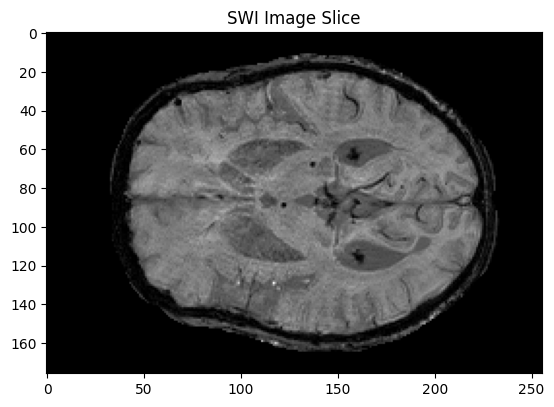

In [1]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NIfTI file
nifti_file = '305_T1_MRI_SWI_BFC_50mm_HM.nii.gz'
img = nib.load(nifti_file)
data = img.get_fdata()

# Check dimensions and visualize a slice
print(data.shape)
slice_idx = data.shape[2] // 2  # Get the middle slice
plt.imshow(data[:, :, slice_idx], cmap='gray')
plt.title('SWI Image Slice')
plt.show()


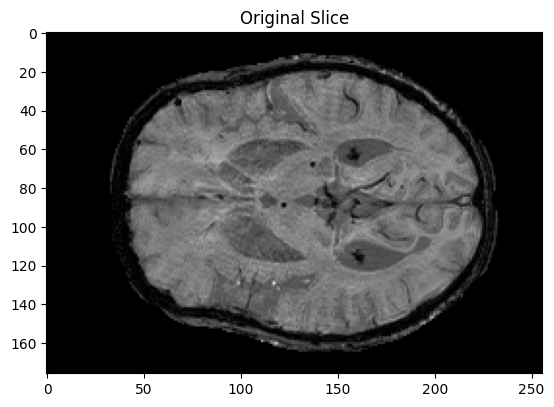

In [2]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi

# Load NIfTI file
nifti_file = '305_T1_MRI_SWI_BFC_50mm_HM.nii.gz'
img = nib.load(nifti_file)
data = img.get_fdata()

# Normalize image data
data_normalized = (data - np.min(data)) / (np.max(data) - np.min(data))

# Select a 2D slice for processing
slice_idx = data.shape[2] // 2  # Middle slice
slice_data = data_normalized[:, :, slice_idx]

# Visualize original slice
plt.imshow(slice_data, cmap='gray')
plt.title('Original Slice')
plt.show()


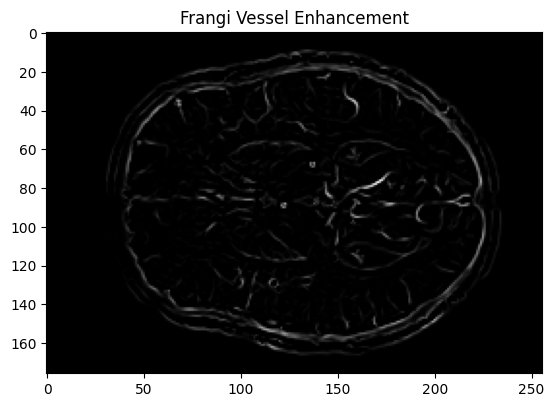

In [3]:
# Apply Frangi filter to enhance vessels
vessel_enhanced = frangi(slice_data)

# Visualize the Frangi-filtered result
plt.imshow(vessel_enhanced, cmap='gray')
plt.title('Frangi Vessel Enhancement')
plt.show()


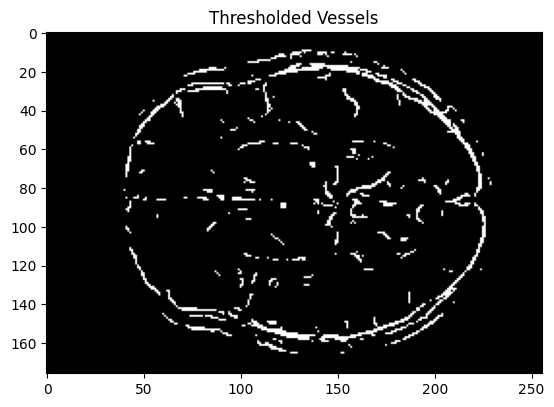

In [4]:
from skimage.filters import threshold_otsu

threshold = threshold_otsu(vessel_enhanced)
binary_vessels = vessel_enhanced > threshold

plt.imshow(binary_vessels, cmap='gray')
plt.title('Thresholded Vessels')
plt.show()


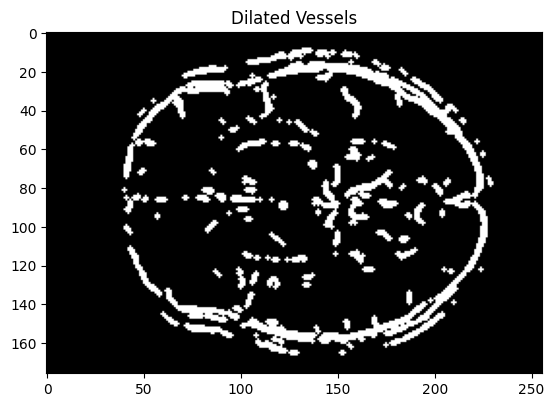

In [5]:
from scipy.ndimage import binary_dilation

dilated_vessels = binary_dilation(binary_vessels)
plt.imshow(dilated_vessels, cmap='gray')
plt.title('Dilated Vessels')
plt.show()


ALL SLICE VISUALIZATION

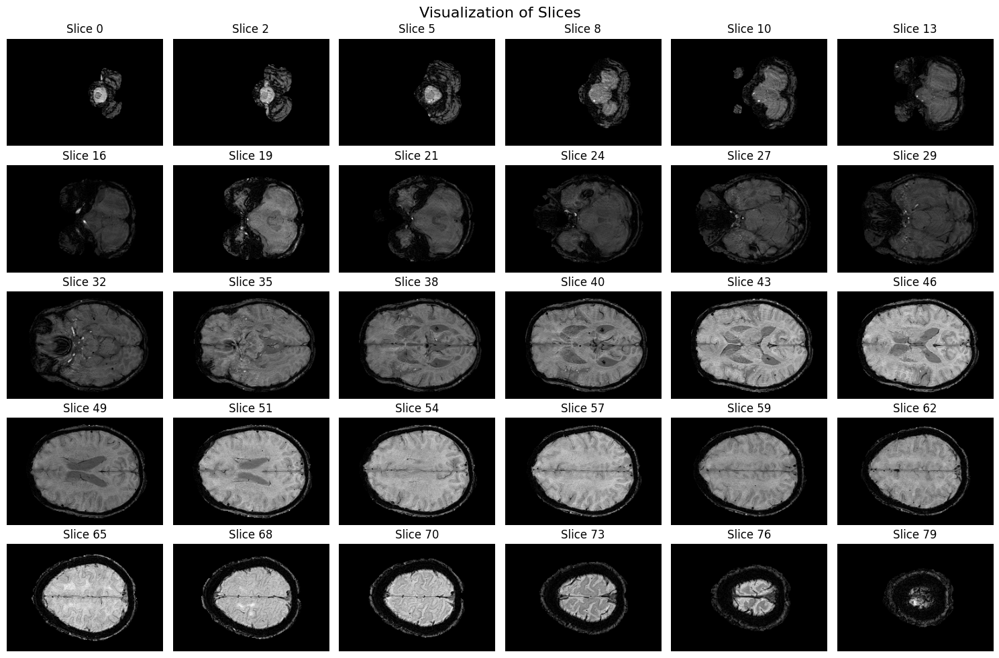

In [2]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

# Load NIfTI file
nifti_file = '305_T1_MRI_SWI_BFC_50mm_HM.nii.gz'
img = nib.load(nifti_file)
data = img.get_fdata()

# Normalize image data
data_normalized = (data - np.min(data)) / (np.max(data) - np.min(data))

num_rows = 5  # Number of rows in the grid
num_cols = 6  # Number of columns in the grid
num_slices = num_rows * num_cols  # Total slices to display

# Sample slice indices evenly across the entire dataset
slice_indices = np.linspace(0, data.shape[2] - 1, num_slices, dtype=int)

# Create a grid for plotting
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
fig.suptitle('Visualization of Slices', fontsize=16)

# Loop through grid and plot slices
for idx, ax in enumerate(axes.flat):
    if idx < len(slice_indices):
        slice_idx = slice_indices[idx]
        ax.imshow(data_normalized[:, :, slice_idx], cmap='gray')
        ax.set_title(f"Slice {slice_idx}")
        ax.axis('off')  # Remove axes for clarity
    else:
        ax.axis('off')  # Hide unused grid cells

plt.tight_layout()
plt.show()


Processed slice 1/80
Processed slice 2/80
Processed slice 3/80
Processed slice 4/80
Processed slice 5/80
Processed slice 6/80
Processed slice 7/80
Processed slice 8/80
Processed slice 9/80
Processed slice 10/80
Processed slice 11/80
Processed slice 12/80
Processed slice 13/80
Processed slice 14/80
Processed slice 15/80
Processed slice 16/80
Processed slice 17/80
Processed slice 18/80
Processed slice 19/80
Processed slice 20/80
Processed slice 21/80
Processed slice 22/80
Processed slice 23/80
Processed slice 24/80
Processed slice 25/80
Processed slice 26/80
Processed slice 27/80
Processed slice 28/80
Processed slice 29/80
Processed slice 30/80
Processed slice 31/80
Processed slice 32/80
Processed slice 33/80
Processed slice 34/80
Processed slice 35/80
Processed slice 36/80
Processed slice 37/80
Processed slice 38/80
Processed slice 39/80
Processed slice 40/80
Processed slice 41/80
Processed slice 42/80
Processed slice 43/80
Processed slice 44/80
Processed slice 45/80
Processed slice 46/

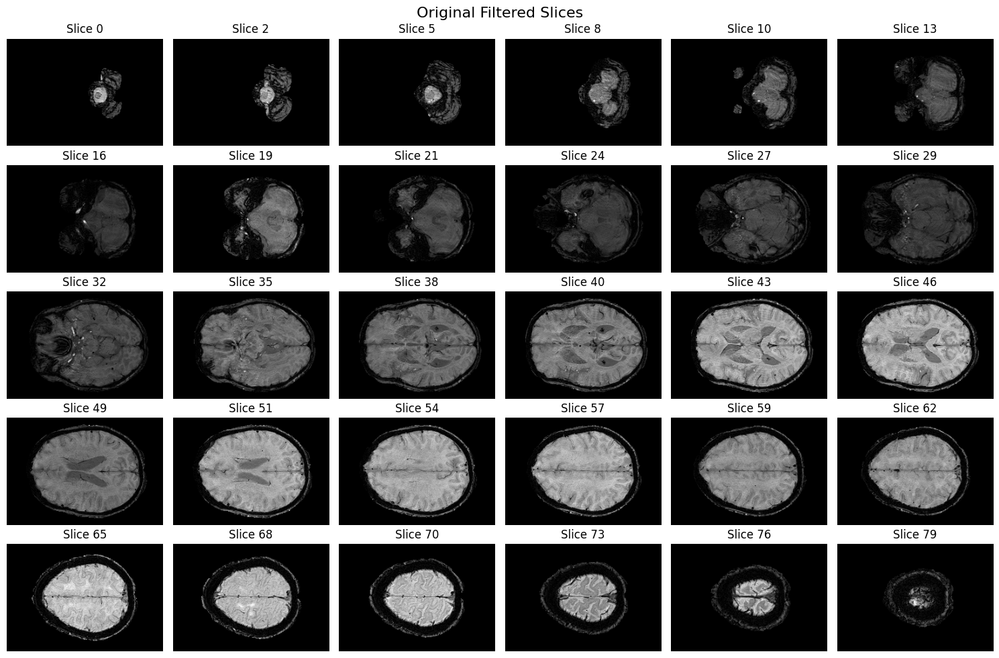

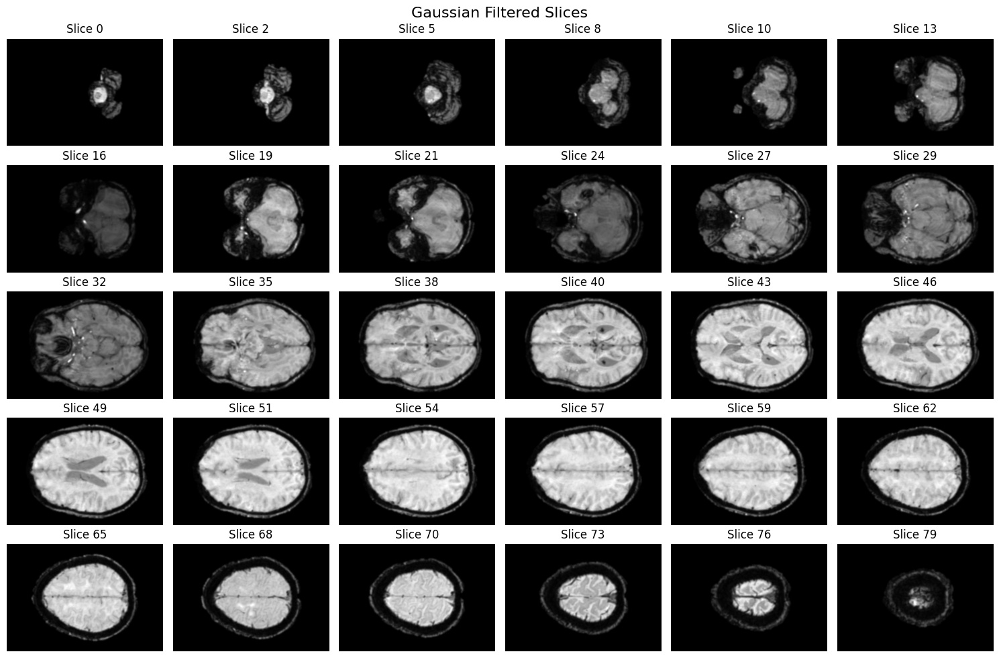

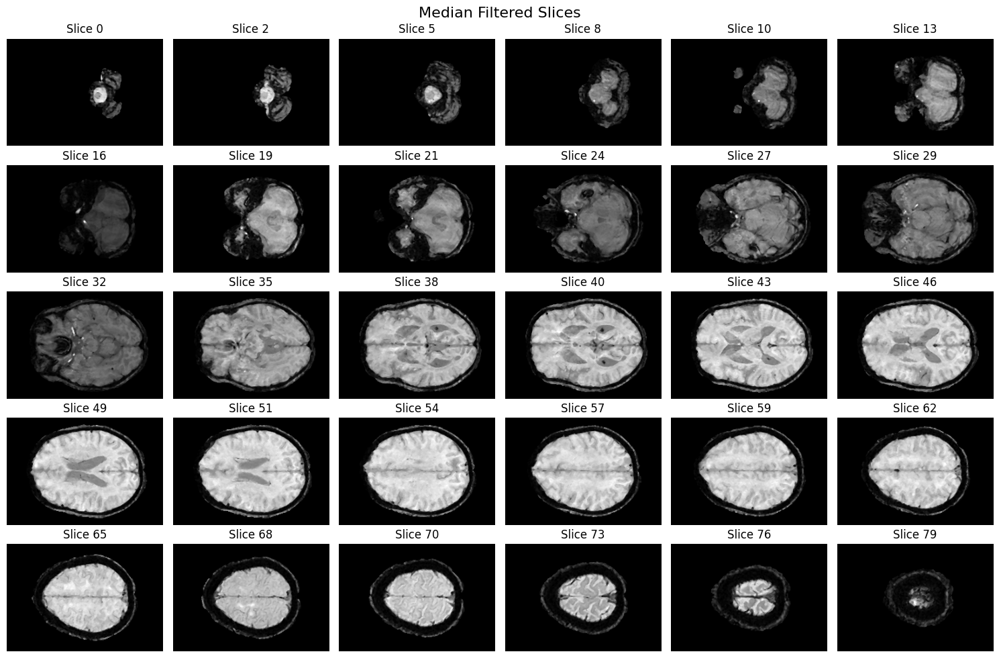

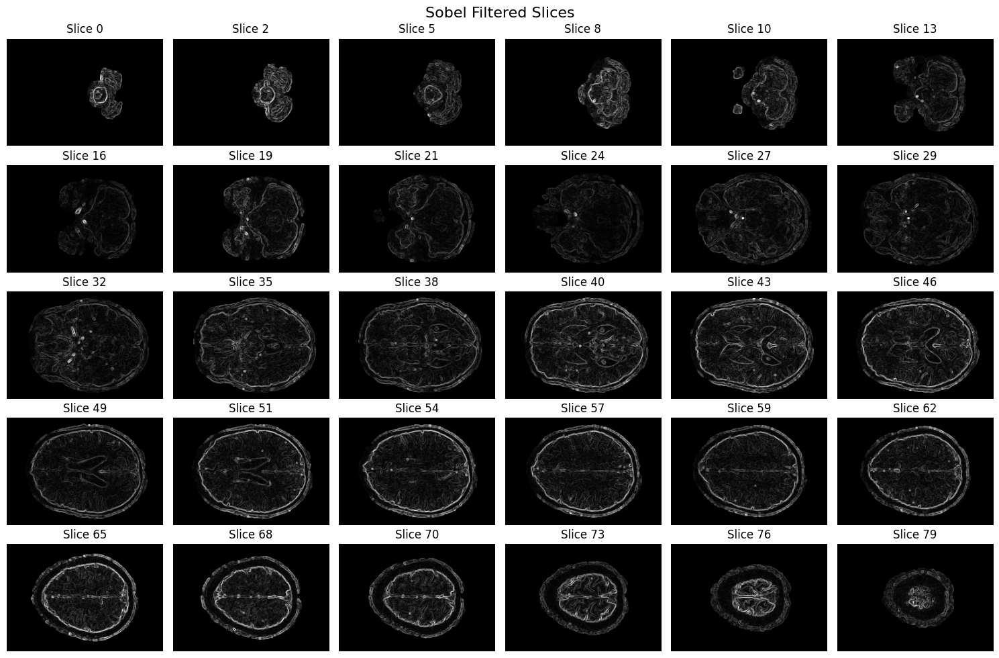

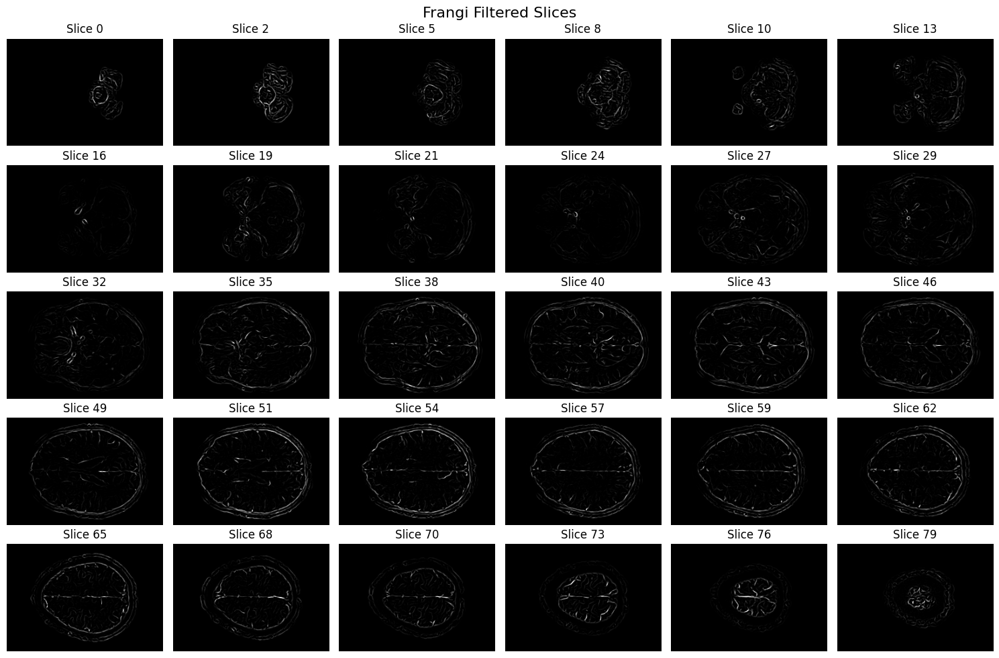

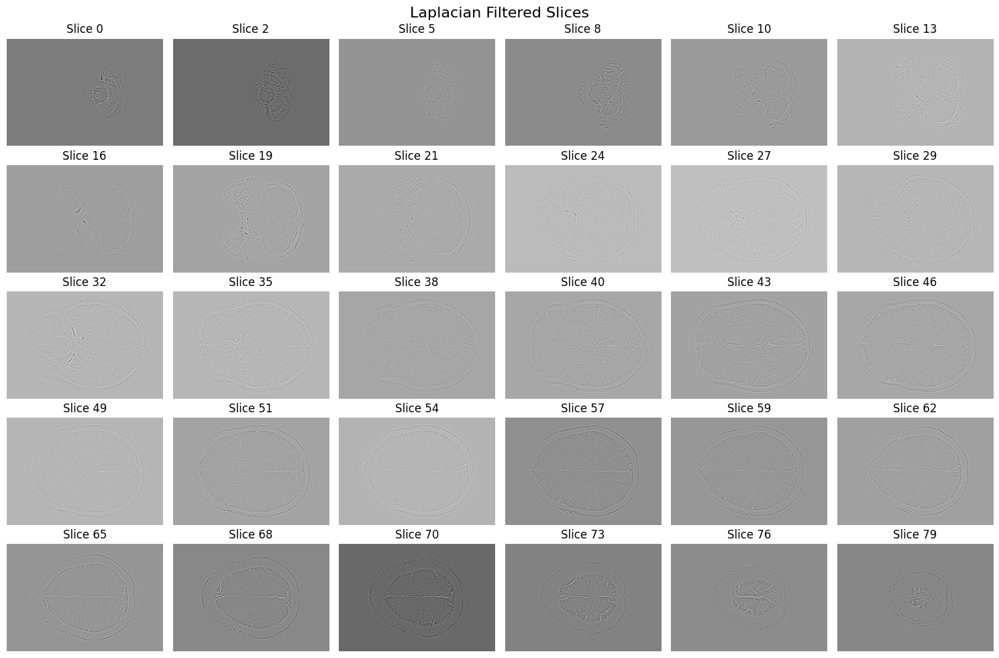

In [5]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, median_filter, laplace
from skimage.filters import sobel, frangi

# Load NIfTI file
nifti_file = '305_T1_MRI_SWI_BFC_50mm_HM.nii.gz'
img = nib.load(nifti_file)
data = img.get_fdata()

# Normalize image data
data_normalized = (data - np.min(data)) / (np.max(data) - np.min(data))

# Initialize arrays to store processed results
gaussian_3d = np.zeros_like(data_normalized)
median_3d = np.zeros_like(data_normalized)
sobel_3d = np.zeros_like(data_normalized)
frangi_3d = np.zeros_like(data_normalized)
laplacian_3d = np.zeros_like(data_normalized)

# Apply filters to all slices
for i in range(data_normalized.shape[2]):
    slice_2d = data_normalized[:, :, i]

    # Apply filters
    gaussian_3d[:, :, i] = gaussian_filter(slice_2d, sigma=1)
    median_3d[:, :, i] = median_filter(slice_2d, size=3)
    sobel_3d[:, :, i] = sobel(slice_2d)
    frangi_3d[:, :, i] = frangi(slice_2d)
    laplacian_3d[:, :, i] = laplace(slice_2d)

    # Progress output
    print(f"Processed slice {i + 1}/{data_normalized.shape[2]}")

# Visualization parameters
num_rows = 5  # Rows in the grid
num_cols = 6  # Columns in the grid
num_slices = num_rows * num_cols  # Total slices to visualize

# Sample slice indices evenly across the dataset
slice_indices = np.linspace(0, data.shape[2] - 1, num_slices, dtype=int)

# Visualize results for each filter
filters = {
    "Original": data_normalized,
    "Gaussian": gaussian_3d,
    "Median": median_3d,
    "Sobel": sobel_3d,
    "Frangi": frangi_3d,
    "Laplacian": laplacian_3d,
}

for filter_name, filter_data in filters.items():
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
    fig.suptitle(f"{filter_name} Filtered Slices", fontsize=16)

    for idx, ax in enumerate(axes.flat):
        if idx < len(slice_indices):
            slice_idx = slice_indices[idx]
            ax.imshow(filter_data[:, :, slice_idx], cmap='gray')
            ax.set_title(f"Slice {slice_idx}")
            ax.axis('off')  # Hide axes
        else:
            ax.axis('off')  # Hide unused grid cells

    plt.tight_layout()
    plt.show()


Processed slice 1/80
Processed slice 2/80
Processed slice 3/80
Processed slice 4/80
Processed slice 5/80
Processed slice 6/80
Processed slice 7/80
Processed slice 8/80
Processed slice 9/80
Processed slice 10/80
Processed slice 11/80
Processed slice 12/80
Processed slice 13/80
Processed slice 14/80
Processed slice 15/80
Processed slice 16/80
Processed slice 17/80
Processed slice 18/80
Processed slice 19/80
Processed slice 20/80
Processed slice 21/80
Processed slice 22/80
Processed slice 23/80
Processed slice 24/80
Processed slice 25/80
Processed slice 26/80
Processed slice 27/80
Processed slice 28/80
Processed slice 29/80
Processed slice 30/80
Processed slice 31/80
Processed slice 32/80
Processed slice 33/80
Processed slice 34/80
Processed slice 35/80
Processed slice 36/80
Processed slice 37/80
Processed slice 38/80
Processed slice 39/80
Processed slice 40/80
Processed slice 41/80
Processed slice 42/80
Processed slice 43/80
Processed slice 44/80
Processed slice 45/80
Processed slice 46/

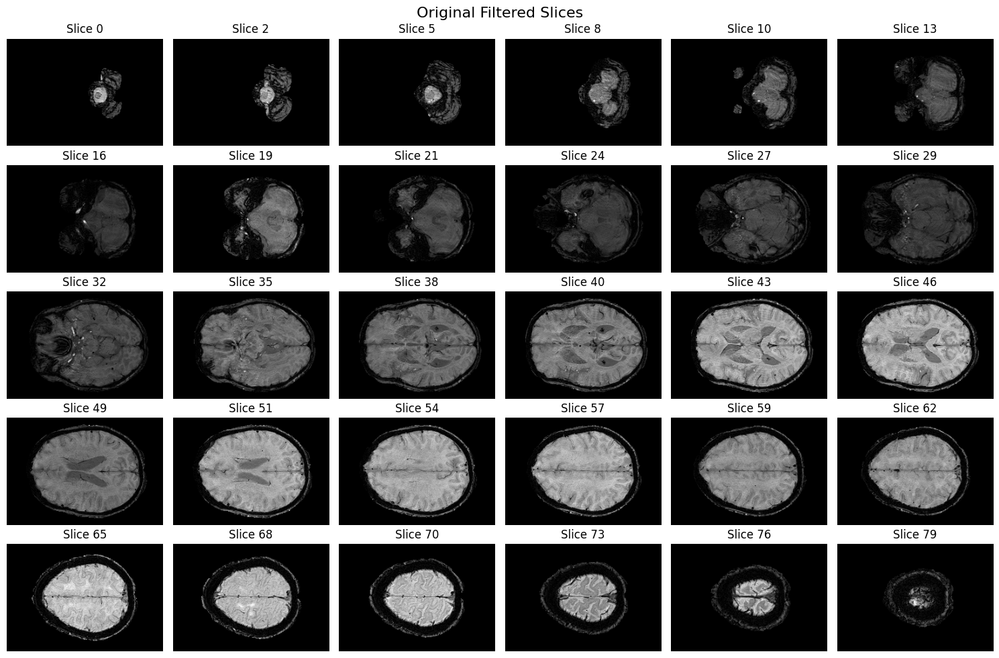

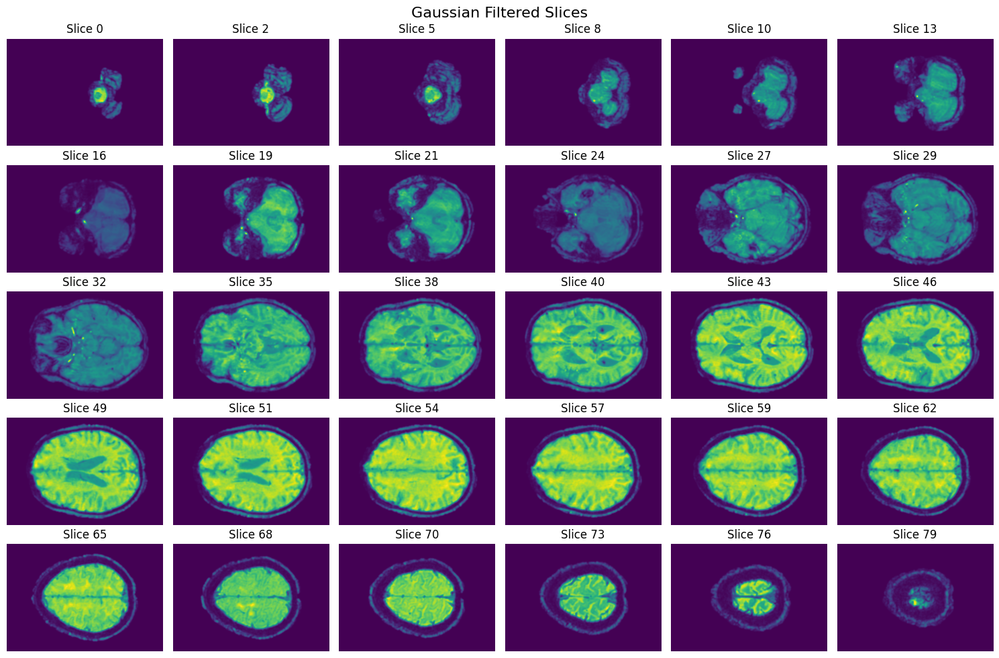

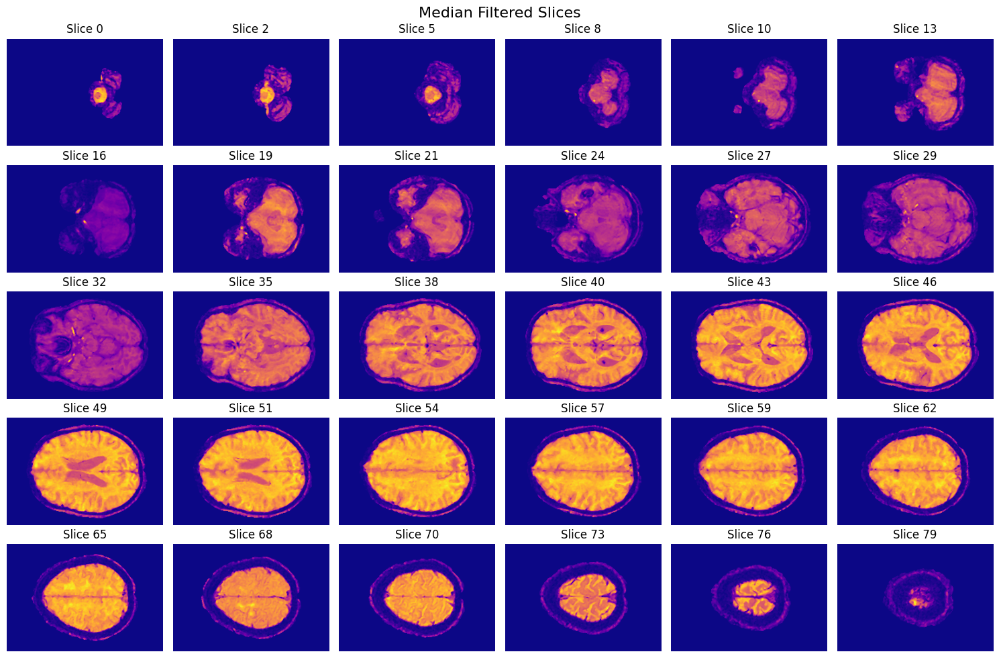

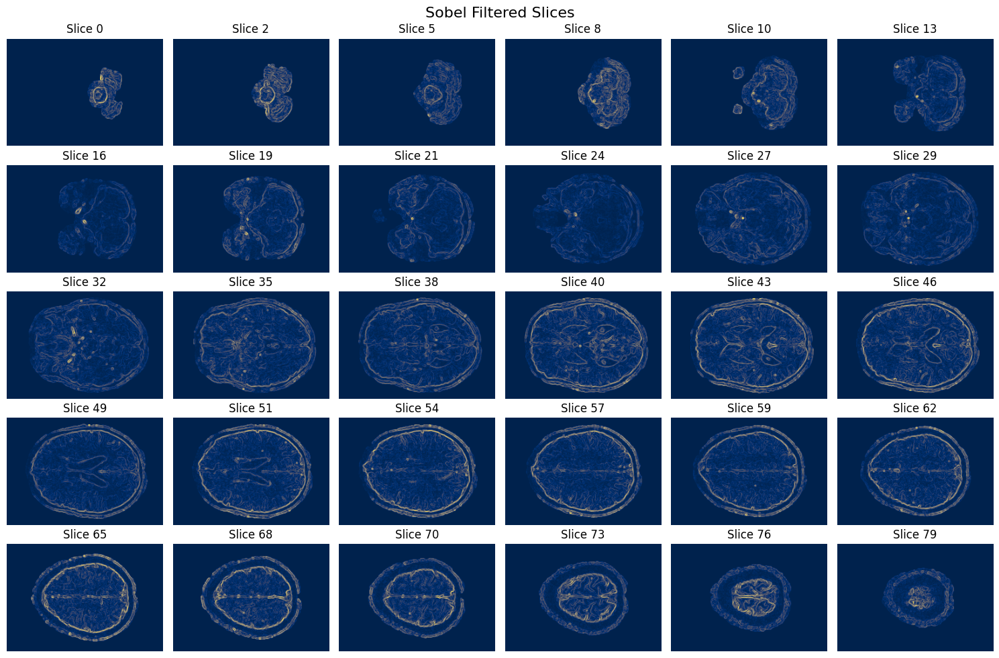

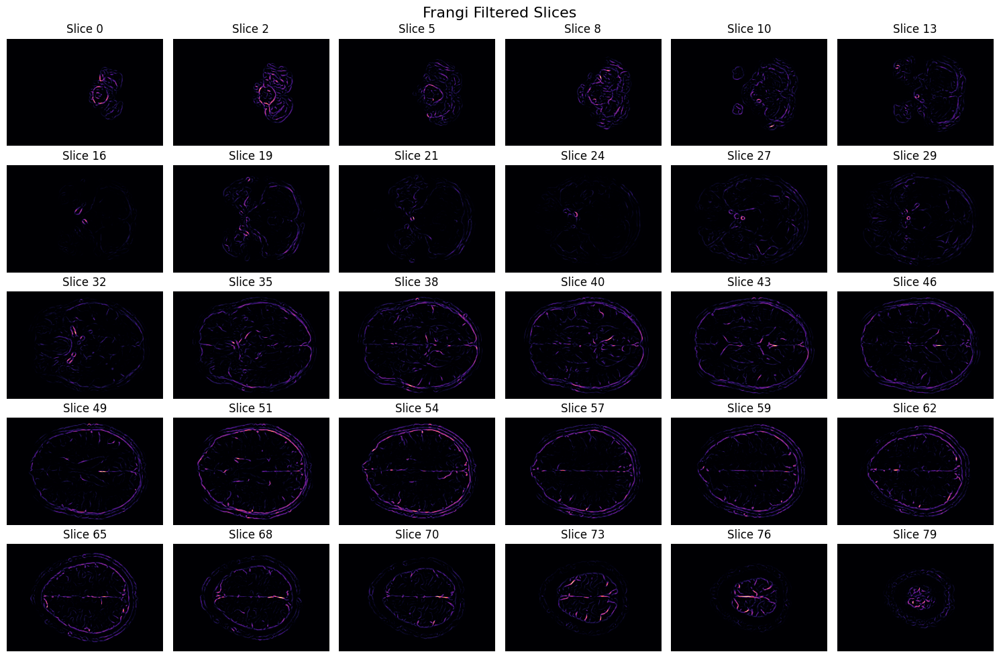

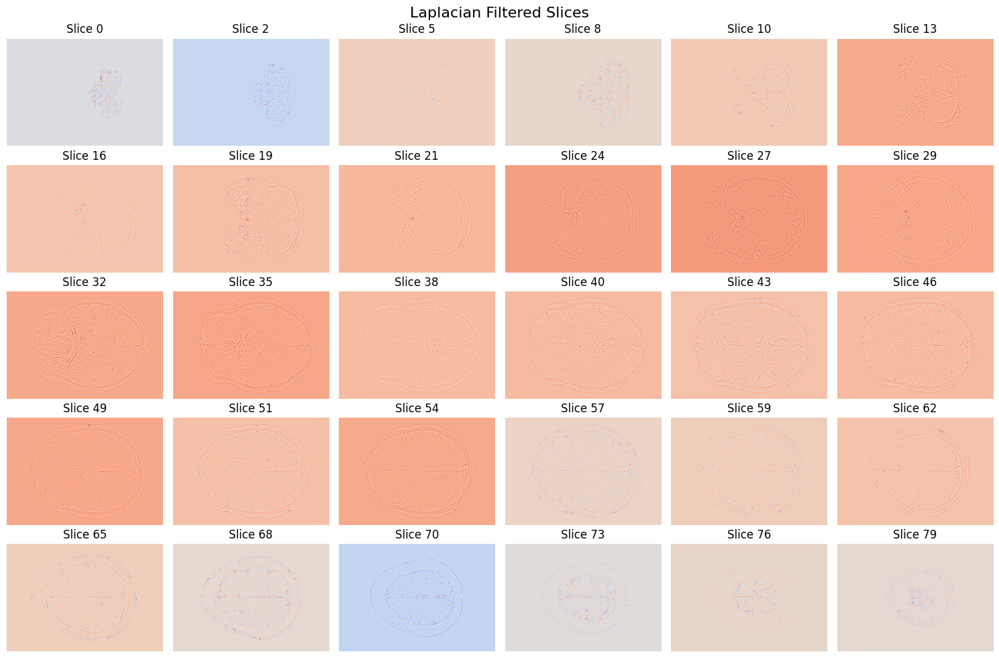

In [7]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, median_filter, laplace
from skimage.filters import sobel, frangi

# Load NIfTI file
nifti_file = '305_T1_MRI_SWI_BFC_50mm_HM.nii.gz'
img = nib.load(nifti_file)
data = img.get_fdata()

# Normalize image data
data_normalized = (data - np.min(data)) / (np.max(data) - np.min(data))

# Initialize arrays to store processed results
gaussian_3d = np.zeros_like(data_normalized)
median_3d = np.zeros_like(data_normalized)
sobel_3d = np.zeros_like(data_normalized)
frangi_3d = np.zeros_like(data_normalized)
laplacian_3d = np.zeros_like(data_normalized)

# Apply filters to all slices
for i in range(data_normalized.shape[2]):
    slice_2d = data_normalized[:, :, i]

    # Apply filters
    gaussian_3d[:, :, i] = gaussian_filter(slice_2d, sigma=1)
    median_3d[:, :, i] = median_filter(slice_2d, size=3)
    sobel_3d[:, :, i] = sobel(slice_2d)
    frangi_3d[:, :, i] = frangi(slice_2d)
    laplacian_3d[:, :, i] = laplace(slice_2d)

    # Progress output
    print(f"Processed slice {i + 1}/{data_normalized.shape[2]}")

# Visualization parameters
num_rows = 5  # Rows in the grid
num_cols = 6  # Columns in the grid
num_slices = num_rows * num_cols  # Total slices to visualize

# Sample slice indices evenly across the dataset
slice_indices = np.linspace(0, data.shape[2] - 1, num_slices, dtype=int)

# Define colormaps for each filter
colormaps = {
    "Original": "gray",
    "Gaussian": "viridis",
    "Median": "plasma",
    "Sobel": "cividis",
    "Frangi": "magma",
    "Laplacian": "coolwarm",
}

# Visualize results for each filter
filters = {
    "Original": data_normalized,
    "Gaussian": gaussian_3d,
    "Median": median_3d,
    "Sobel": sobel_3d,
    "Frangi": frangi_3d,
    "Laplacian": laplacian_3d,
}

for filter_name, filter_data in filters.items():
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
    fig.suptitle(f"{filter_name} Filtered Slices", fontsize=16)

    for idx, ax in enumerate(axes.flat):
        if idx < len(slice_indices):
            slice_idx = slice_indices[idx]
            ax.imshow(filter_data[:, :, slice_idx], cmap=colormaps[filter_name])
            ax.set_title(f"Slice {slice_idx}")
            ax.axis('off')  # Hide axes
        else:
            ax.axis('off')  # Hide unused grid cells

    plt.tight_layout()
    plt.show()


Gaussian Filter (Smoothing)
The Gaussian filter helps reduce noise in the MRI data. It works by smoothing the image, making it less grainy and easier to analyze.
The sigma parameter controls the level of smoothing. Larger values produce more smoothing.

In [ ]:
from scipy.ndimage import gaussian_filter
gaussian_3d = gaussian_filter(data_normalized, sigma=1)


Median Filter (Noise Reduction)
The Median filter is effective at removing salt-and-pepper noise while preserving edges. It replaces each pixel with the median value of its neighboring pixels.
The size parameter defines the size of the neighborhood used to calculate the median.

In [ ]:
from scipy.ndimage import median_filter

# Apply median filter slice by slice
median_3d = np.zeros_like(data_normalized)
for i in range(data.shape[2]):
    median_3d[:, :, i] = median_filter(data_normalized[:, :, i], size=3)


In [ ]:
from skimage.filters import sobel

# Apply Sobel filter slice by slice
sobel_3d = np.zeros_like(data_normalized)
for i in range(data.shape[2]):
    sobel_3d[:, :, i] = sobel(data_normalized[:, :, i])
